<a href="https://colab.research.google.com/github/shwbak/HAI-Anomaly-Detection/blob/main/EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from glob import glob

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Data Upload
train_files = glob('/content/drive/MyDrive/data/train/*.csv')
valid_files = glob('/content/drive/MyDrive/data/validation/*.csv')
test_files  = glob('/content/drive/MyDrive/data/test/*.csv')

df_trains = [pd.read_csv(file) for file in train_files]
df_valids = [pd.read_csv(file) for file in valid_files]
df_tests  = [pd.read_csv(file) for file in test_files]

In [ ]:
# Data 관측 시간 및 개수 확인
for i, df in enumerate(df_trains[0:1]):
    print(f"Train #{i+1} | START: {df['timestamp'].min()} | END: {df['timestamp'].max()} | DATA POINT: {len(df)}")
for i, df in enumerate(df_trains[1:]):
    print(f"Train #{i+2} | START: {df['timestamp'].min()} | END: {df['timestamp'].max()} | DATA POINT: {len(df)}")
for i, df in enumerate(df_valids):
    print(f"Valid #{i+1} | START: {df['timestamp'].min()} | END: {df['timestamp'].max()} | DATA POINT: {len(df)}")
for i, df in enumerate(df_tests):
    print(f"Test  #{i+1} | START: {df['timestamp'].min()} | END: {df['timestamp'].max()} | DATA POINT: {len(df)}")

Train #1 | START: 2021-07-11 10:00:00 | END: 2021-07-12 12:00:00 | DATA POINT: 93601
Train #2 | START: 2021-07-17 00:00:01 | END: 2021-07-19 08:00:00 | DATA POINT: 201600
Train #3 | START: 2021-07-26 12:00:00 | END: 2021-07-27 12:00:00 | DATA POINT: 86401
Train #4 | START: 2021-07-23 18:00:01 | END: 2021-07-25 05:00:00 | DATA POINT: 126000
Train #5 | START: 2021-08-02 15:00:01 | END: 2021-08-05 09:00:00 | DATA POINT: 237600
Train #6 | START: 2021-08-06 09:00:01 | END: 2021-08-09 09:00:00 | DATA POINT: 259200
Valid #1 | START: 2021-07-10 00:00:01 | END: 2021-07-11 00:00:00 | DATA POINT: 86400
Test  #1 | START: 2021-07-14 17:40:01 | END: 2021-07-15 11:00:00 | DATA POINT: 62400
Test  #2 | START: 2021-07-13 16:00:01 | END: 2021-07-14 15:00:00 | DATA POINT: 82800
Test  #3 | START: 2021-07-15 12:00:01 | END: 2021-07-17 00:00:00 | DATA POINT: 129600


In [ ]:
# 변수 별 분포 확인 시각화 함수 
def plot(column, s=10):
    plt.figure(figsize=(20, 4))
    plt.title(column)
    plt.scatter(pd.to_datetime(df_trains[0]['timestamp']), df_trains[0][column], color='k',       s=s, label='Train'  )
    plt.scatter(pd.to_datetime(df_trains[1]['timestamp']), df_trains[1][column], color='k',       s=s                 )
    plt.scatter(pd.to_datetime(df_trains[2]['timestamp']), df_trains[2][column], color='k',       s=s                 )
    plt.scatter(pd.to_datetime(df_trains[3]['timestamp']), df_trains[3][column], color='k',       s=s                 )
    plt.scatter(pd.to_datetime(df_trains[4]['timestamp']), df_trains[4][column], color='k',       s=s                 )
    plt.scatter(pd.to_datetime(df_trains[5]['timestamp']), df_trains[5][column], color='k',       s=s                 ) 
    plt.scatter(pd.to_datetime(df_valids[0]['timestamp']), df_valids[0][column], color='blue',    s=s, label='Valid'  )
    plt.scatter(pd.to_datetime(df_tests[0]['timestamp']),  df_tests[0][column],  color='r',       s=s, label='Test #1')
    plt.scatter(pd.to_datetime(df_tests[1]['timestamp']),  df_tests[1][column],  color='#E84A3B', s=s, label='Test #2')
    plt.scatter(pd.to_datetime(df_tests[2]['timestamp']),  df_tests[2][column],  color='#F49D81', s=s, label='Test #3')
    plt.legend(loc = 'upper right')
    plt.xlabel('Date')
    plt.show()

# columns = [f'C{str(i).zfill(2)}' for i in range(1, 87)]
# for column in columns:
#     plot(column)

In [ ]:
# Train data 파일 6개를 하나로 합치기 
df = pd.concat([df_trains[0], df_trains[1], df_trains[2], df_trains[3], df_trains[4], df_trains[5]])

In [ ]:
# DataFrame 결측치 확인 
df.isnull().sum().sum()

0

In [ ]:
# 상수 변수 제외 
for col in df.columns:
    if df[col].nunique() == 1:
        print(f"Column '{col}' consists only of constants, removing...")
        df.drop(columns=[col], inplace=True)

In [ ]:
# 각 변수의 분포를 확인하는 함수 
def train_data_feature_plotting(feature_name):
  for feature_name in feature_name:
      fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15, 5))
      axs[0, 0].plot(df_trains[0][feature_name])
      axs[0, 0].set_title('2021-07-11 10:00:00 ~ 2021-07-12 12:00:00')
      axs[0, 0].xaxis.set_visible(False)

      axs[0, 1].plot(df_trains[1][feature_name])
      axs[0, 1].set_title('2021-07-17 00:00:01 ~ 2021-07-19 08:00:00')
      axs[0, 1].xaxis.set_visible(False)

      axs[0, 2].plot(df_trains[2][feature_name])
      axs[0, 2].set_title('2021-07-26 12:00:00 ~ 2021-07-27 12:00:00')
      axs[0, 2].xaxis.set_visible(False)

      axs[1, 0].plot(df_trains[3][feature_name])
      axs[1, 0].set_title('2021-07-23 18:00:01 ~ 2021-07-25 05:00:00')
      axs[1, 0].xaxis.set_visible(False)

      axs[1, 1].plot(df_trains[4][feature_name])
      axs[1, 1].set_title('2021-08-02 15:00:01 ~ 2021-08-05 09:00:00')
      axs[1, 1].xaxis.set_visible(False)

      axs[1, 2].plot(df_trains[5][feature_name])
      axs[1, 2].set_title('2021-08-06 09:00:01 ~ 2021-08-09 09:00:00')
      axs[1, 2].xaxis.set_visible(False)

      plt.tight_layout()
      plt.show()

C01


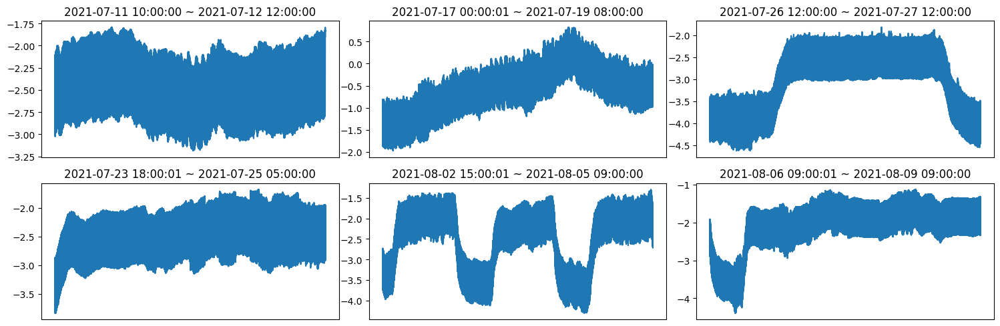


C03


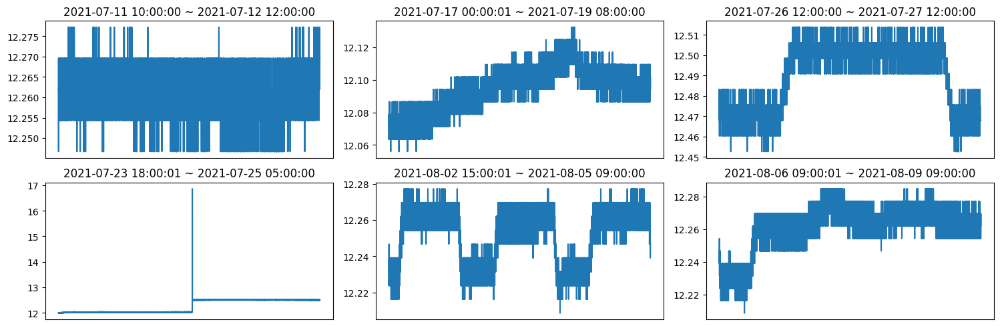


C04


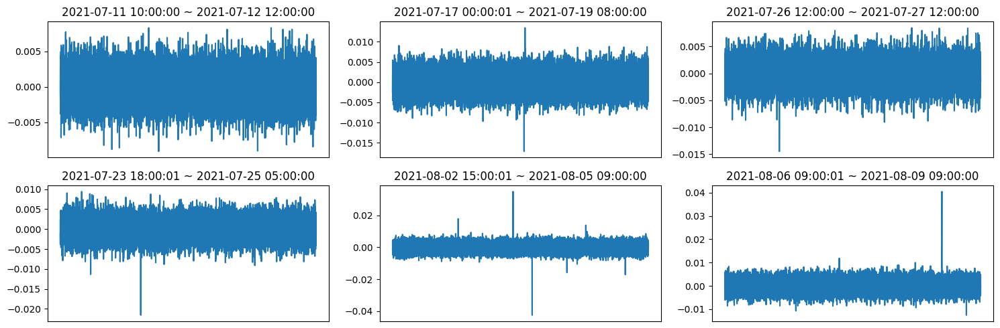


C05


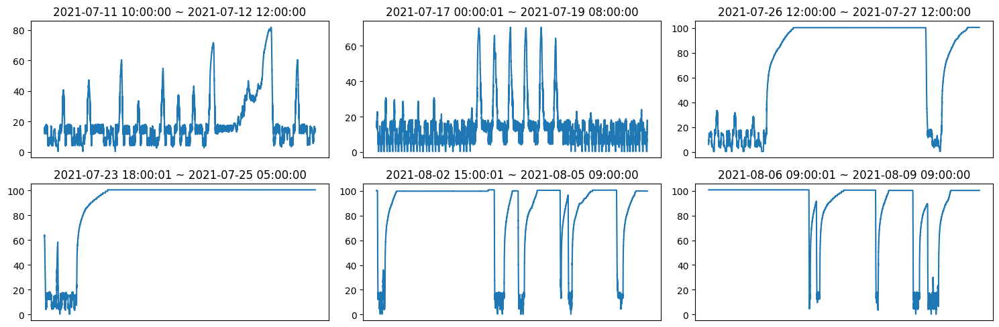


C06


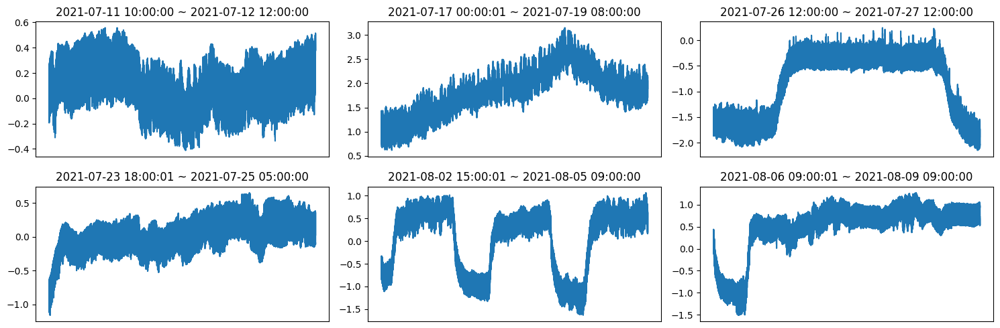


C07


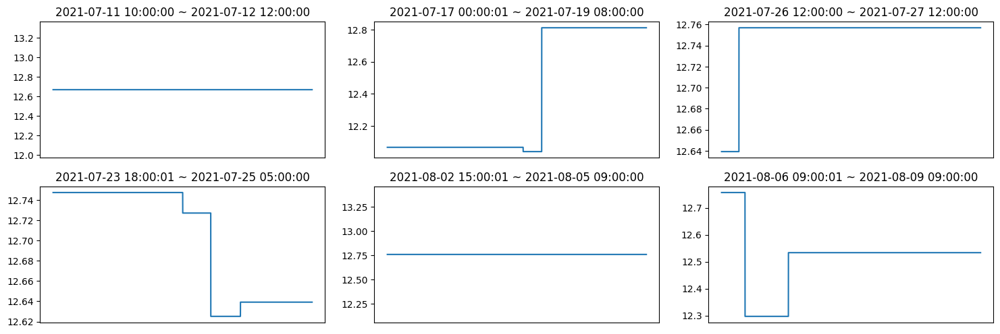


C08


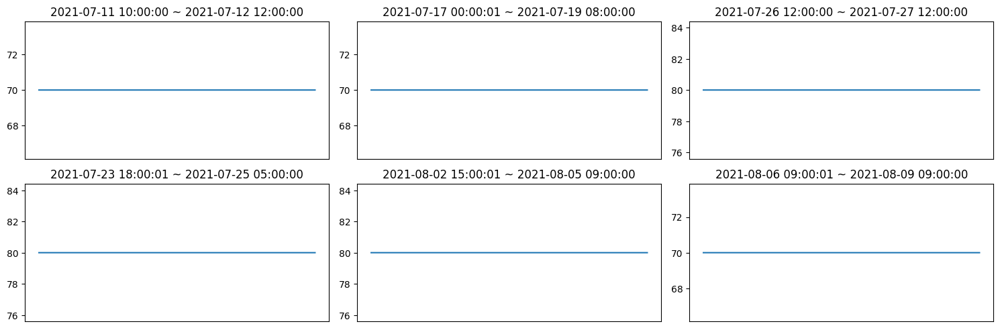


C11


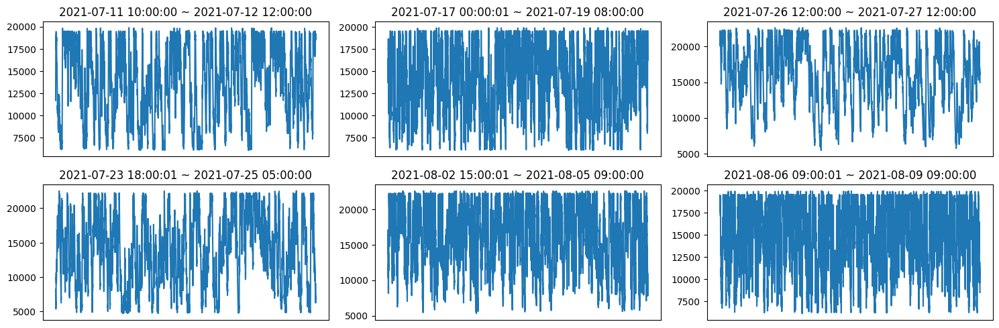


C12


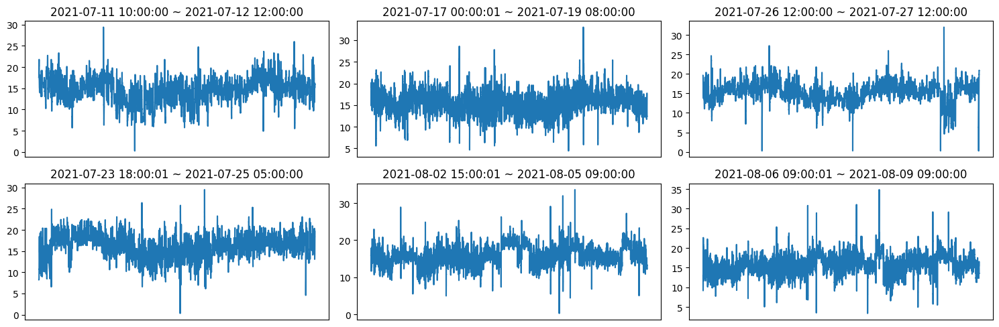


C13


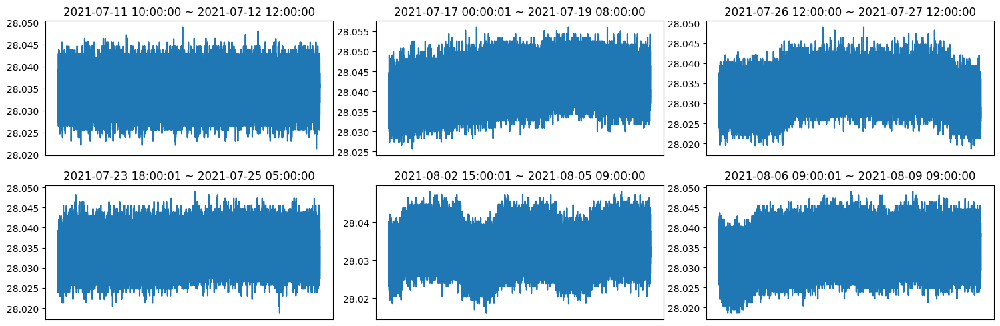


C14


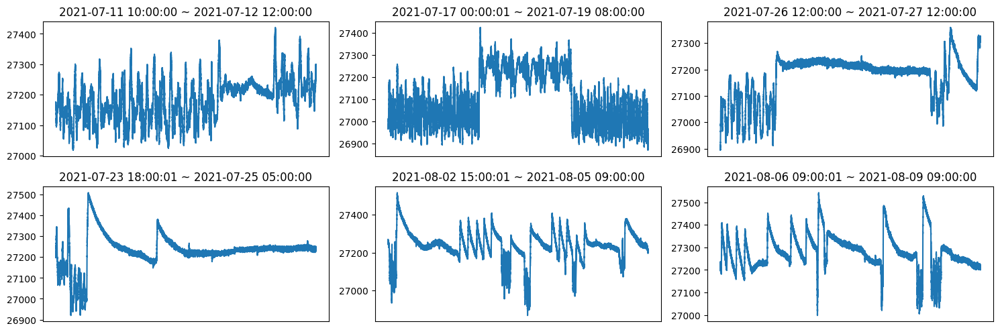


C15


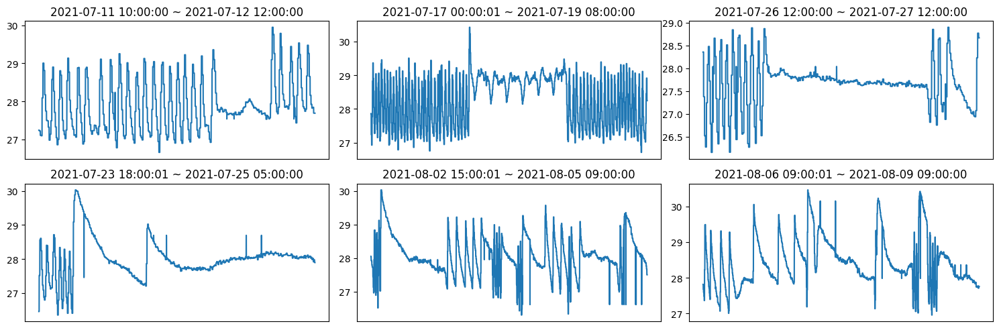


C16


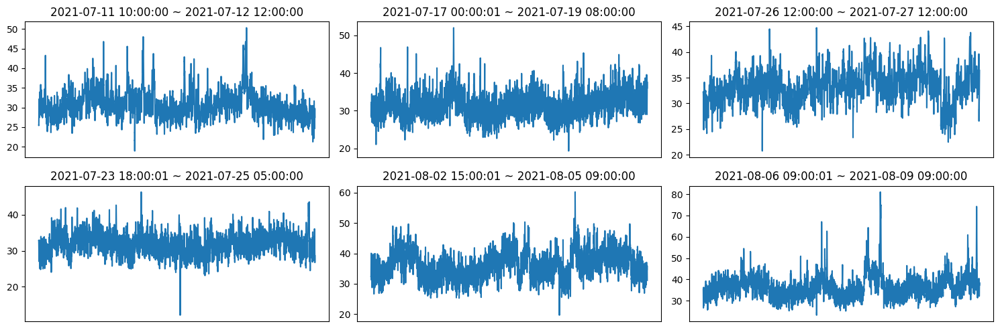


C17


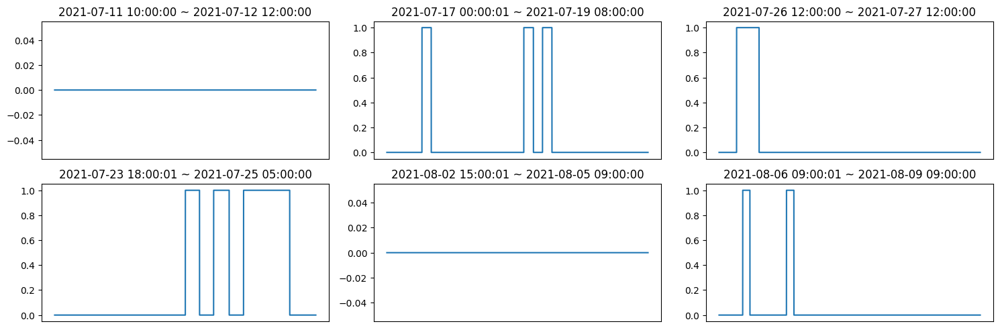


C20


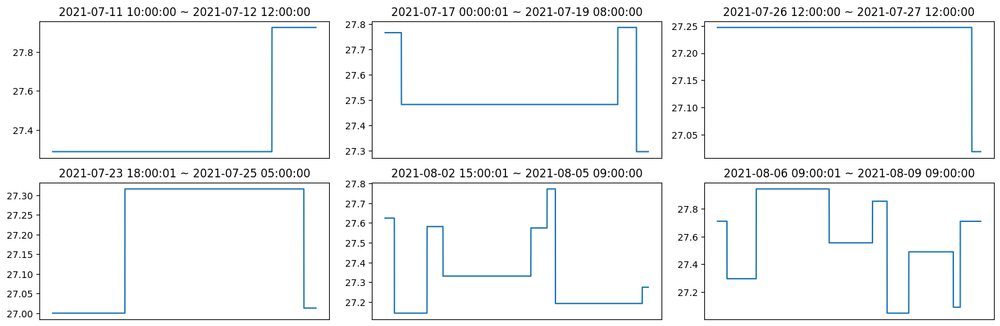


C21


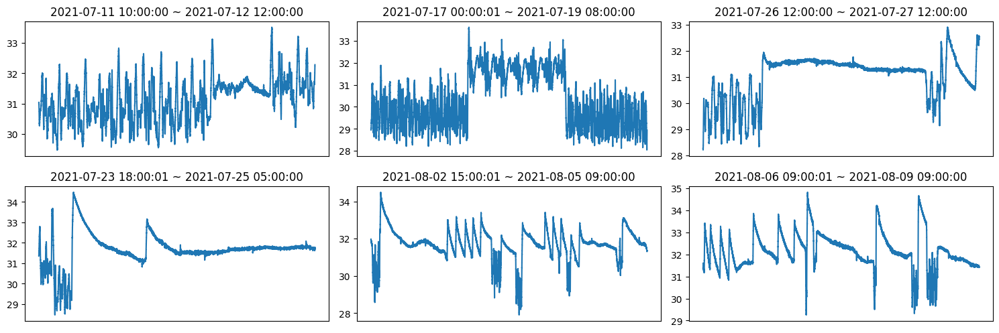


C23


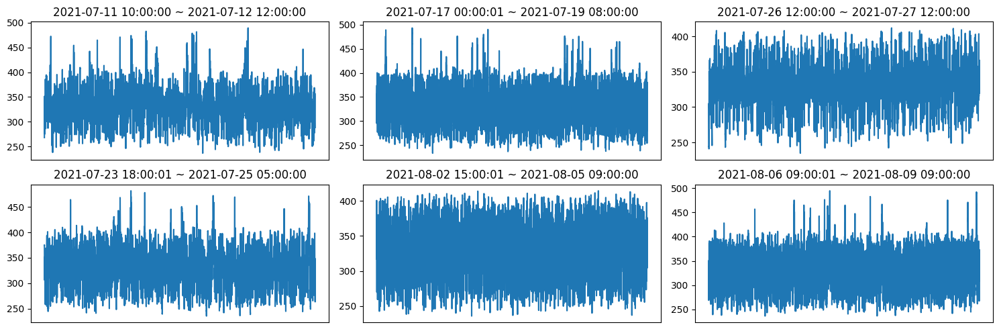


C24


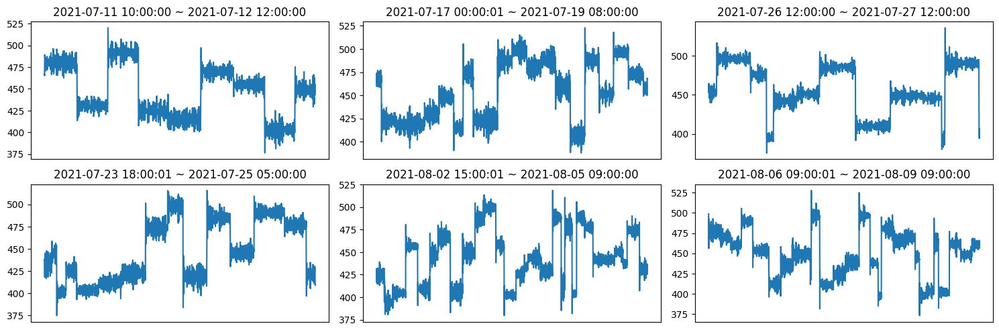


C25


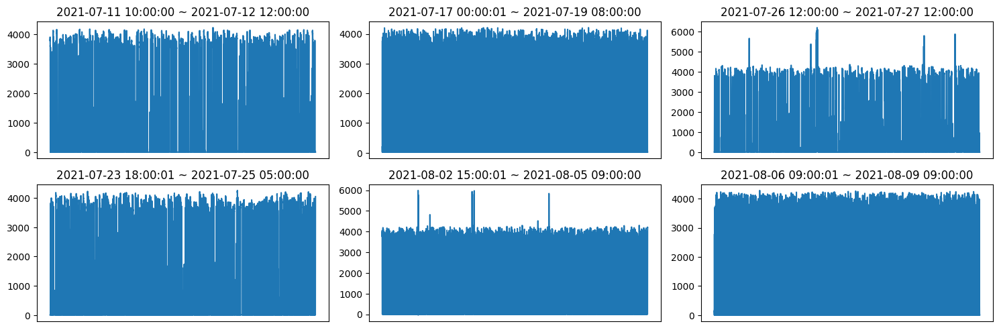


C27


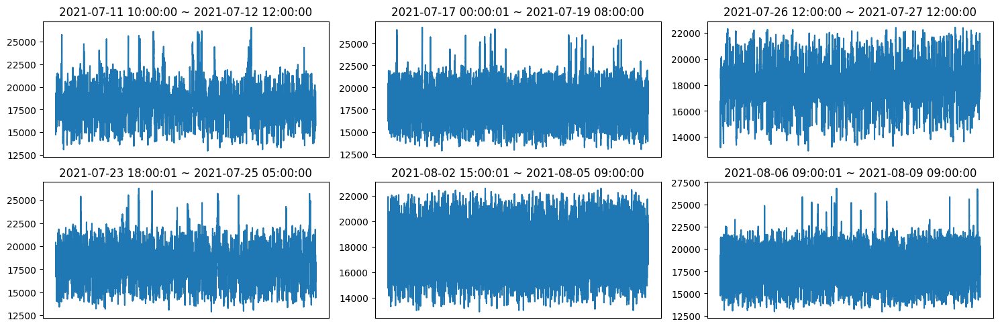


C28


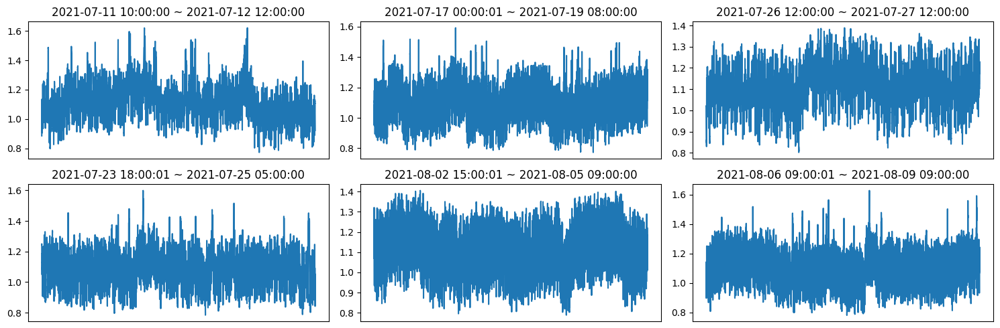


C30


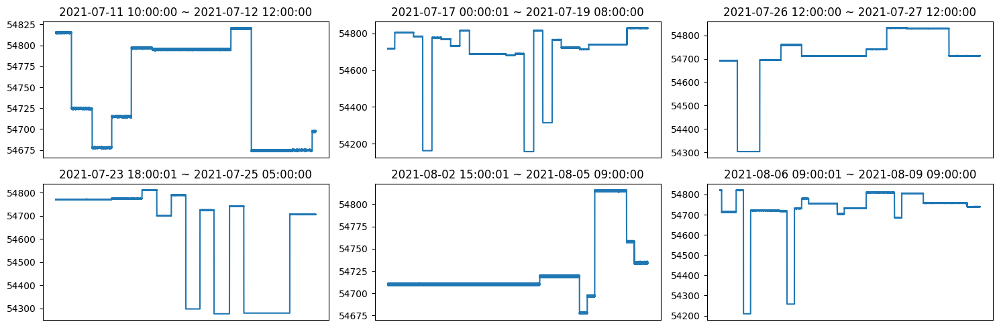


C31


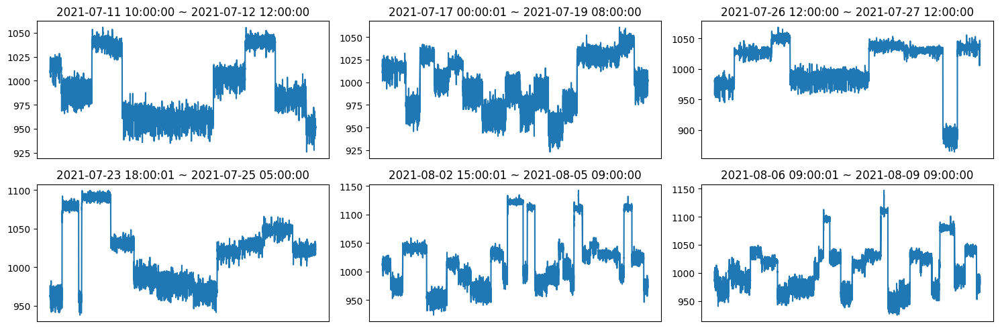


C32


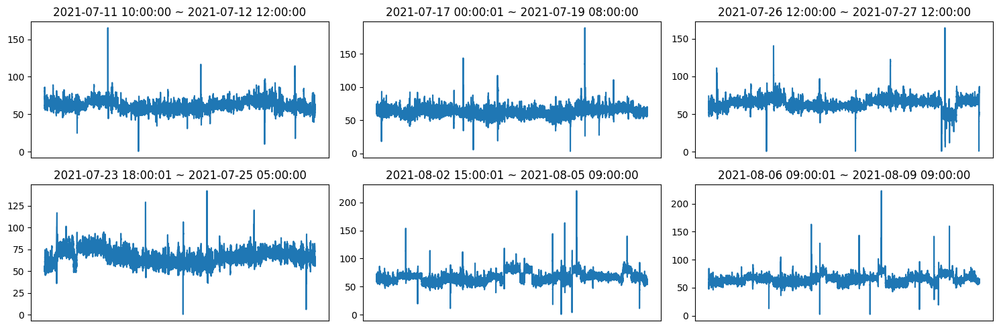


C33


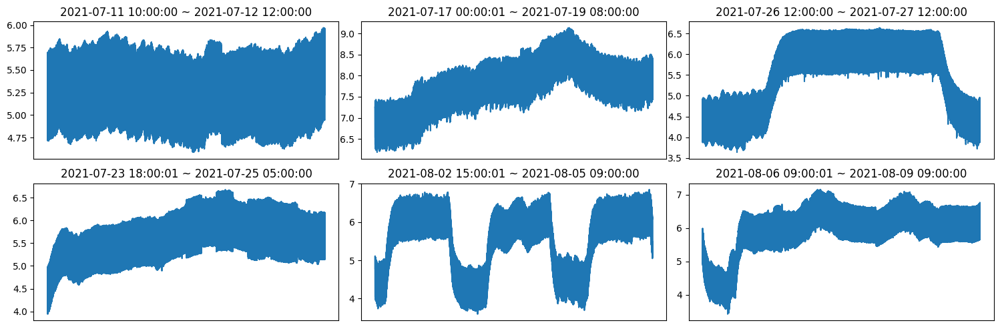


C34


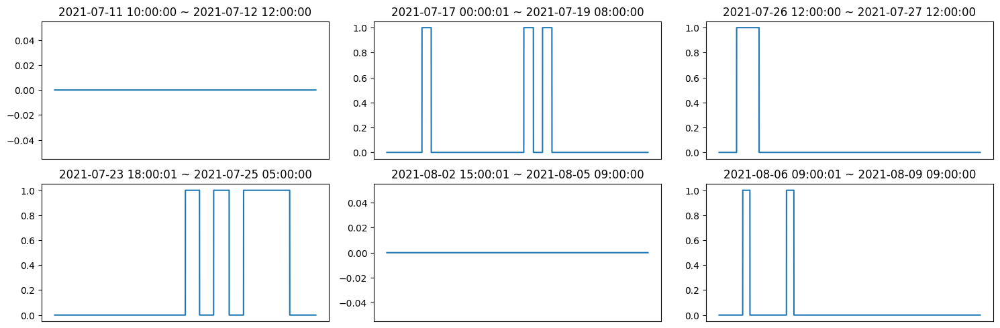


C35


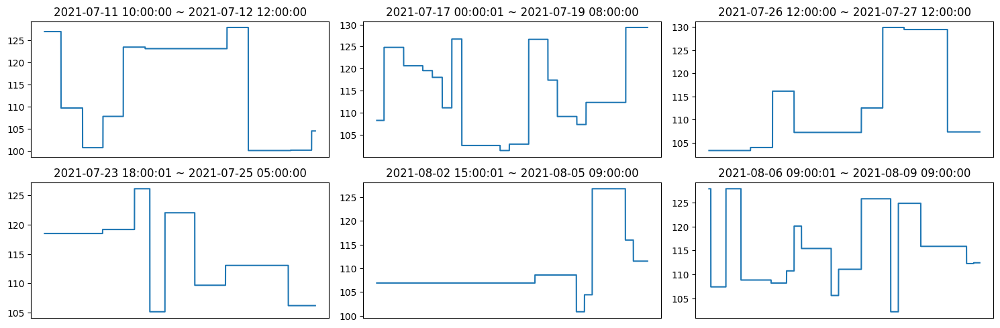


C37


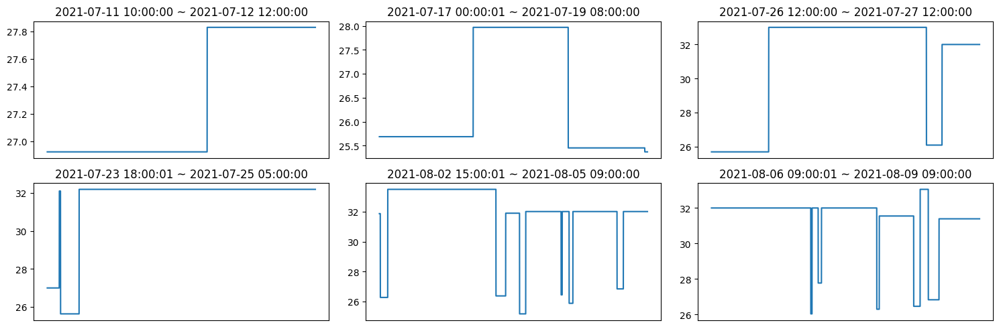


C40


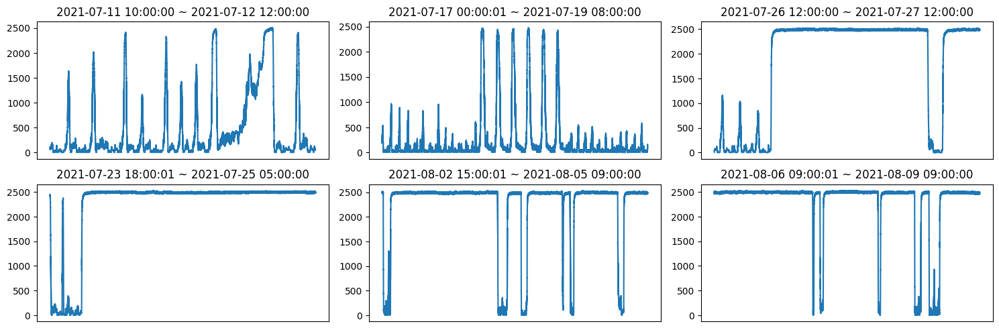


C41


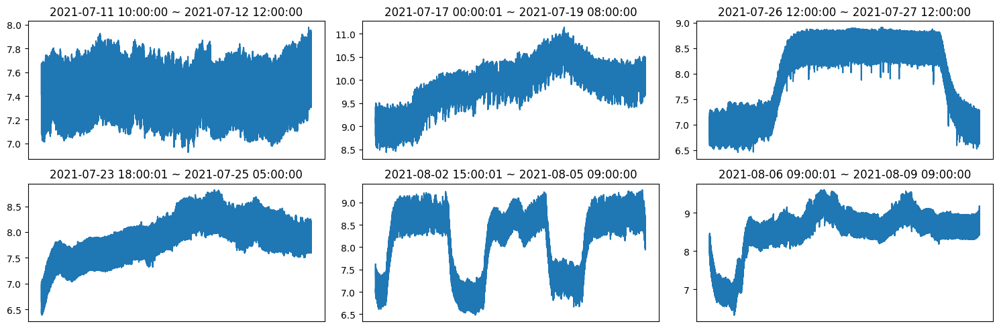


C42


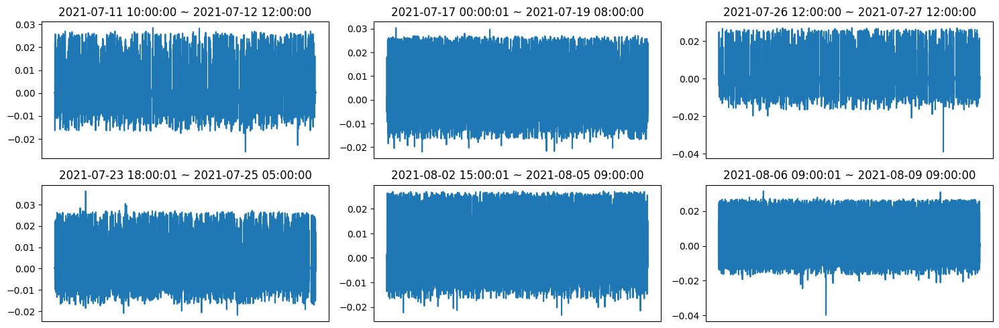


C43


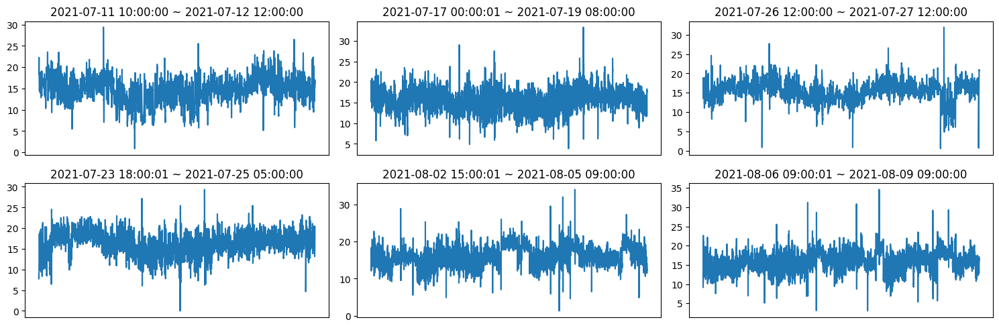


C44


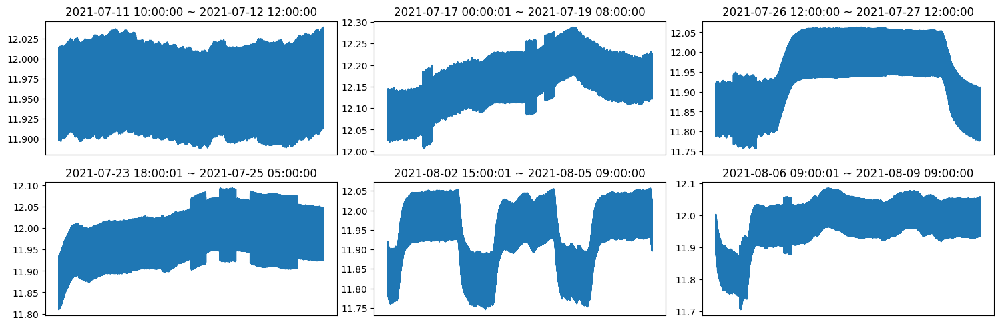


C45


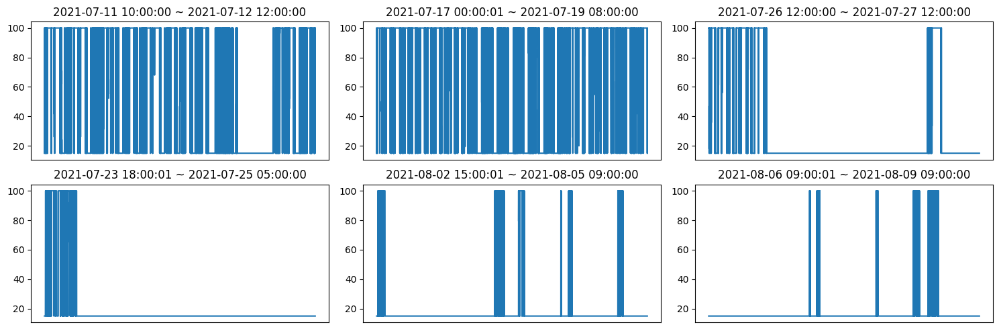


C46


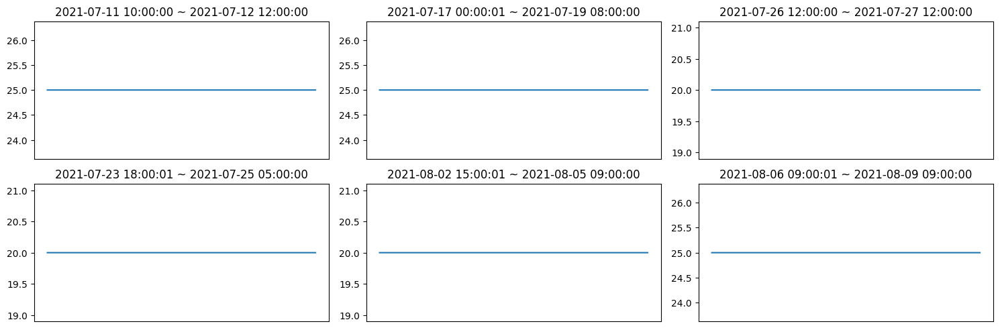


C47


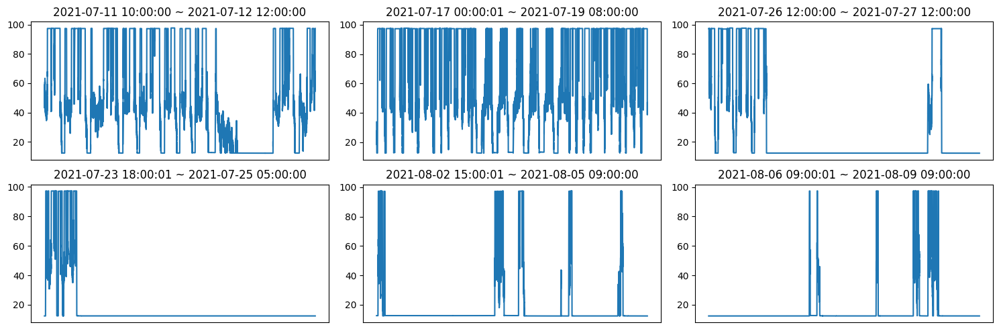


C48


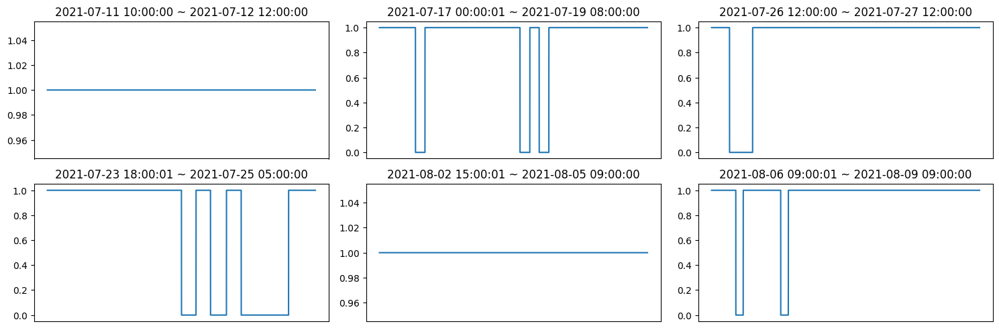


C50


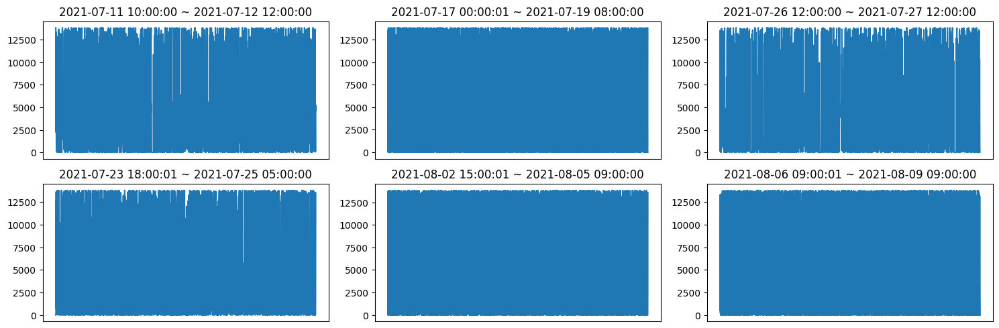


C51


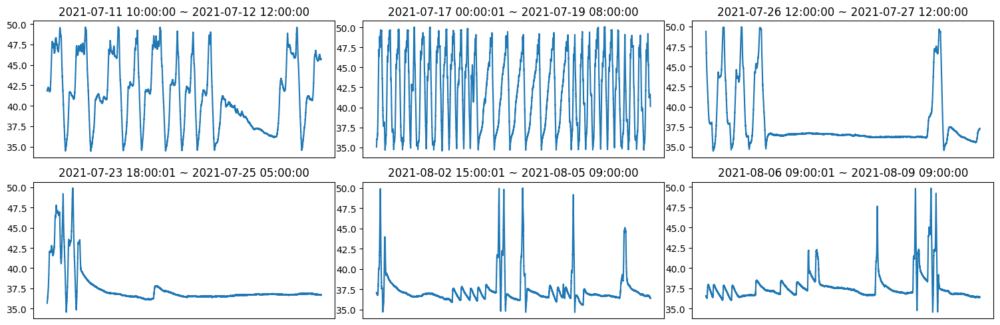


C53


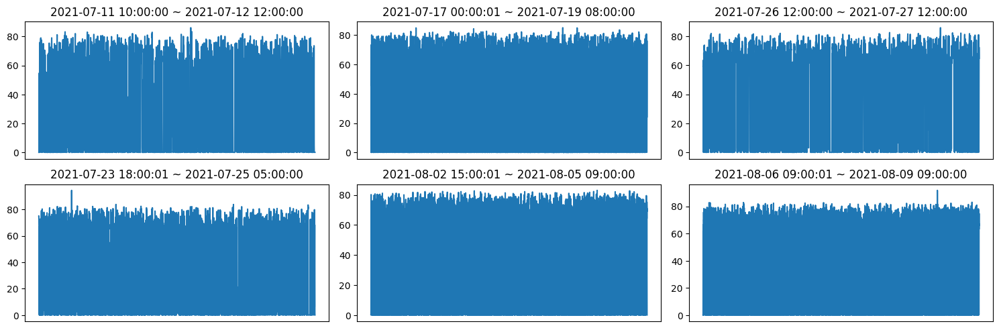


C54


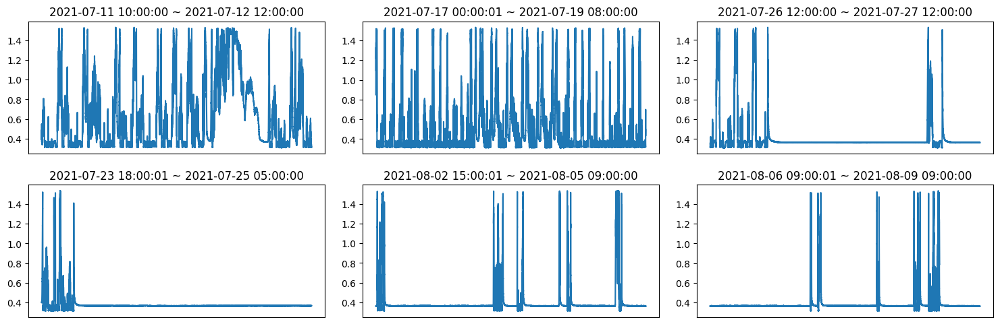


C56


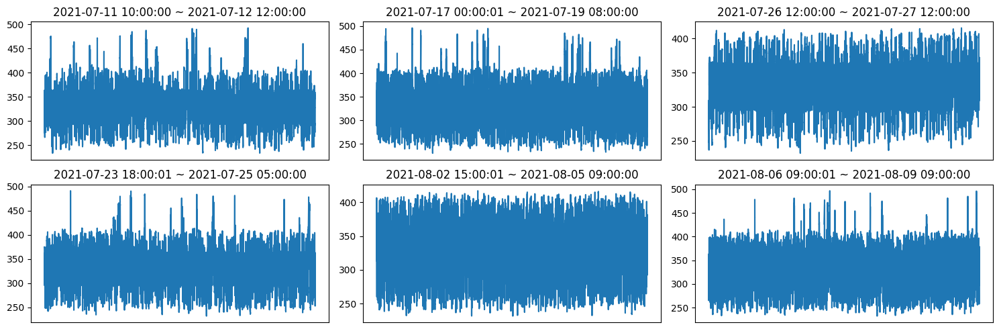


C57


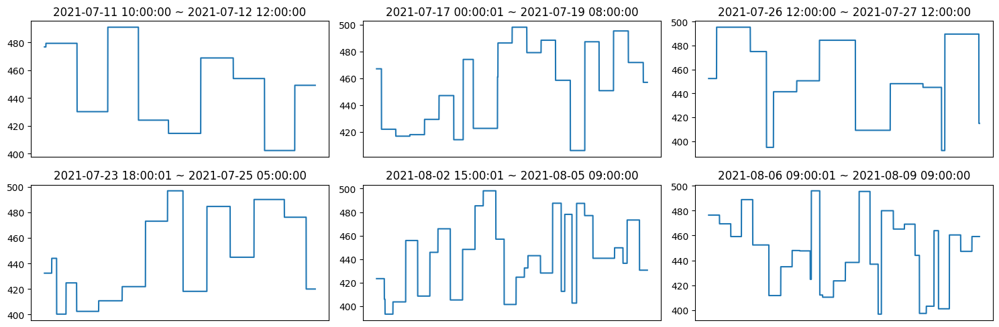


C58


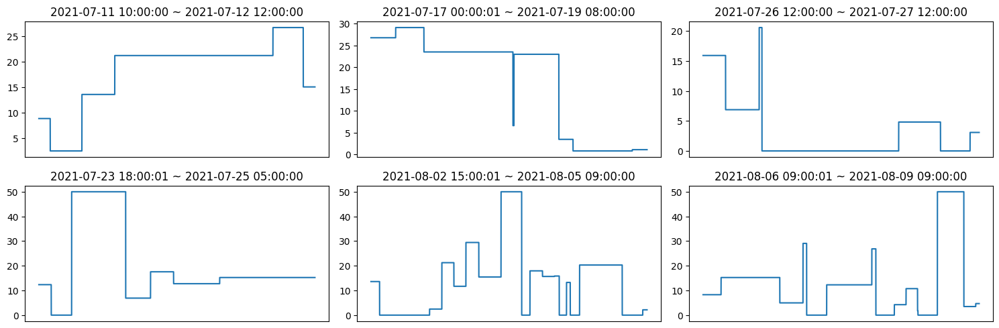


C59


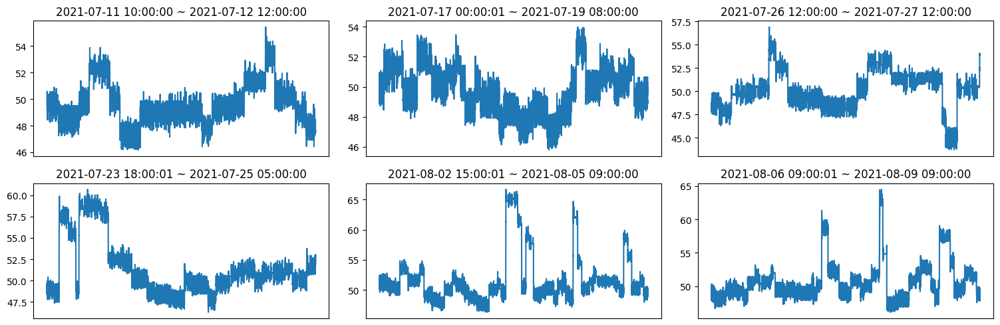


C60


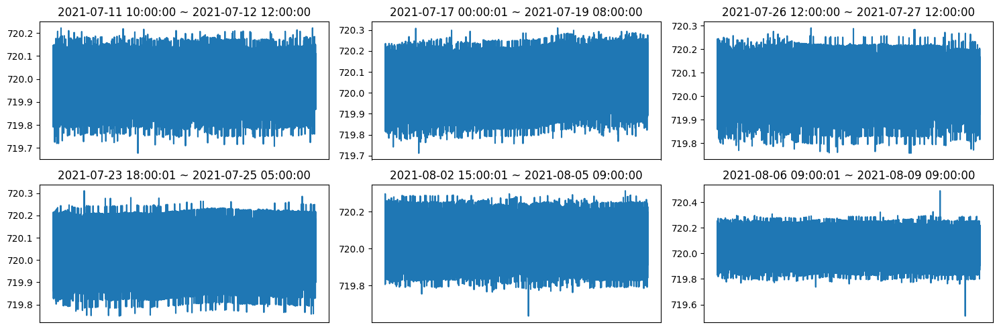


C61


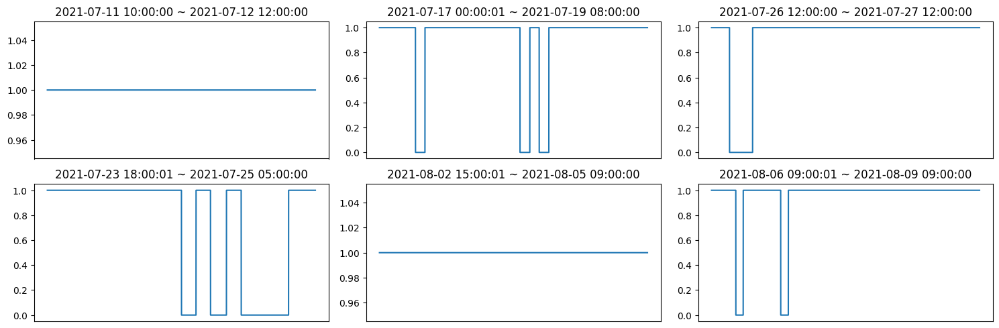


C62


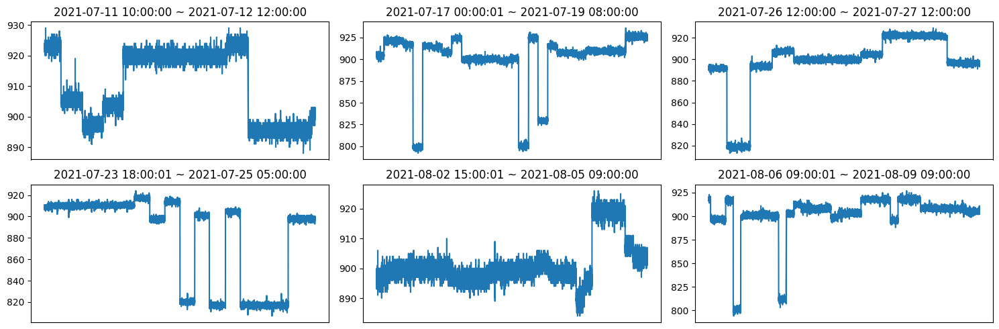


C64


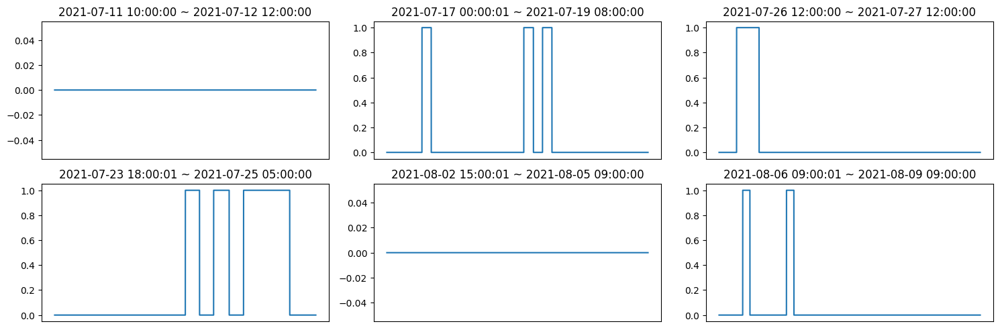


C65


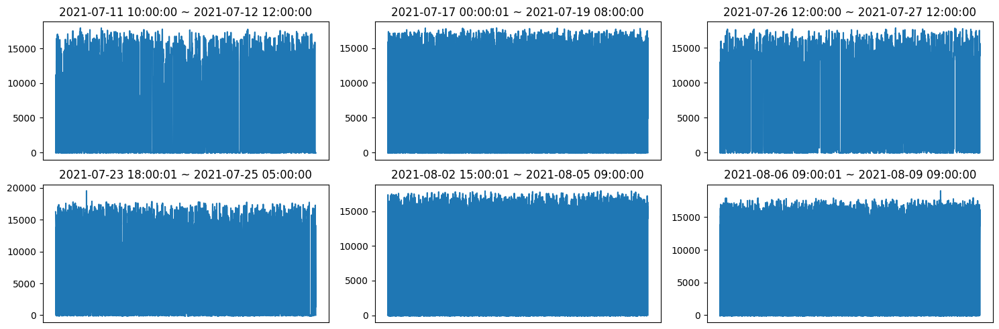


C66


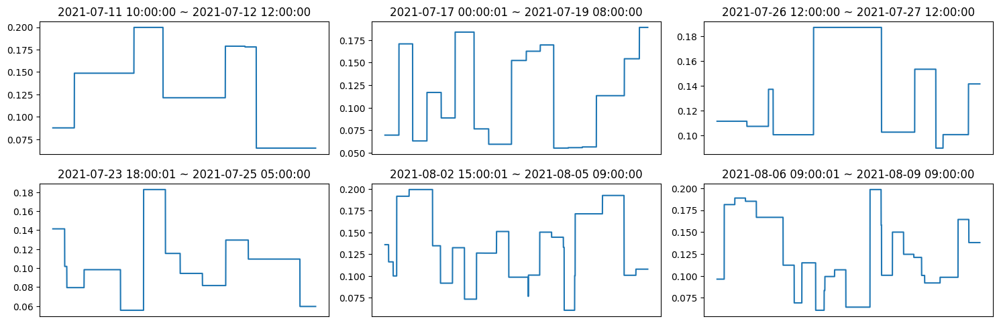


C67


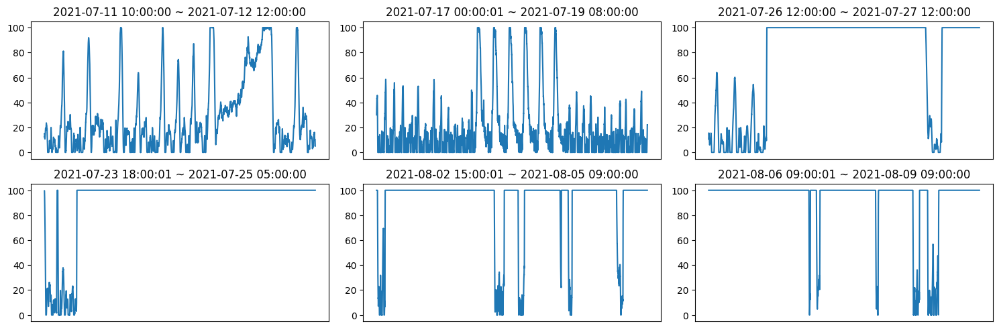


C68


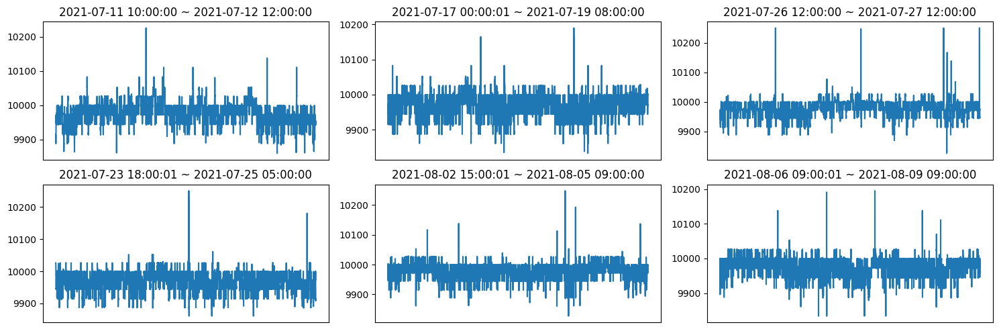


C70


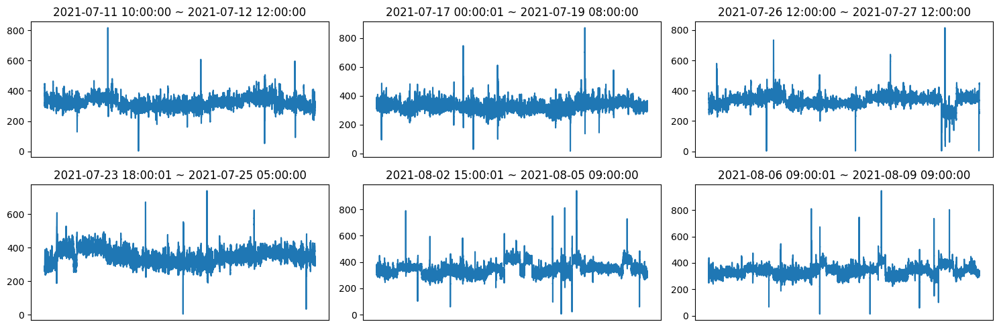


C71


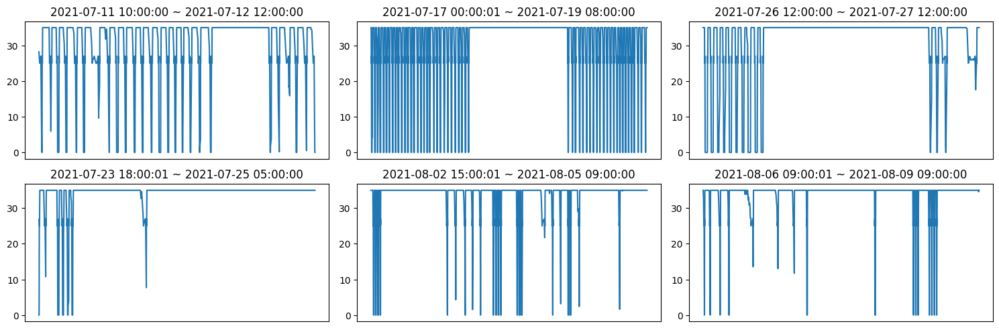


C72


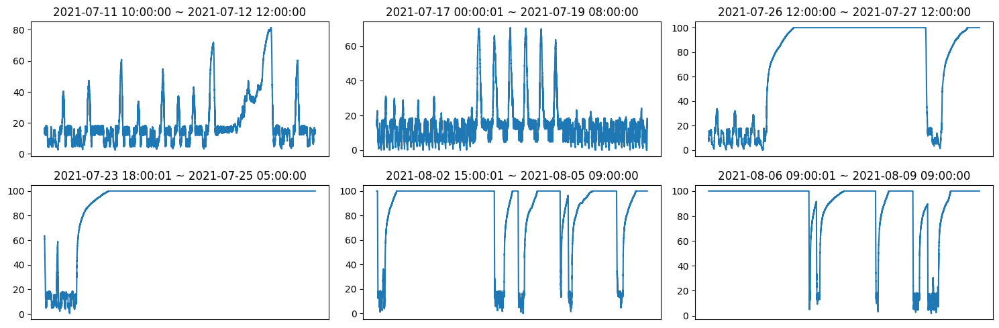


C73


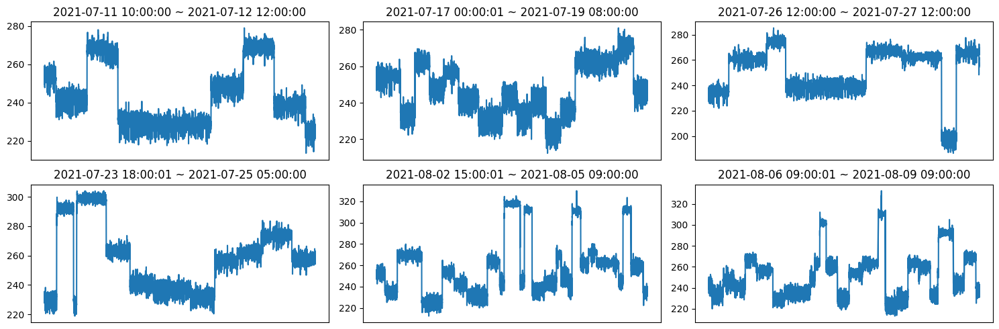


C74


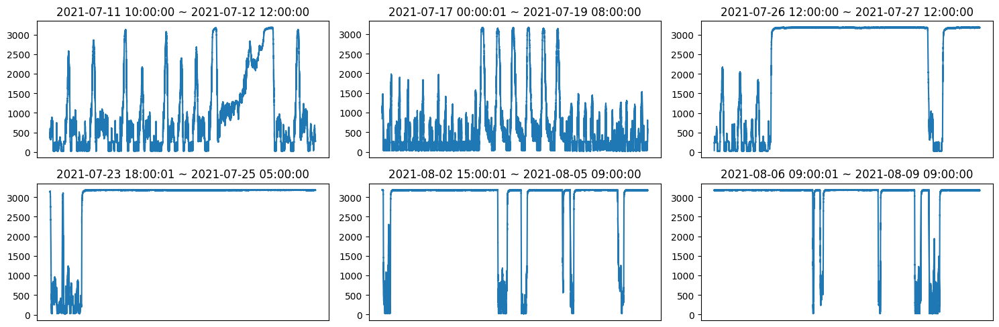


C75


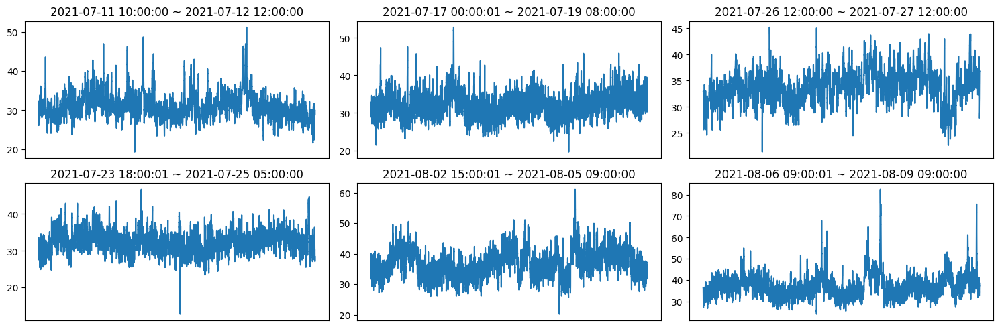


C76


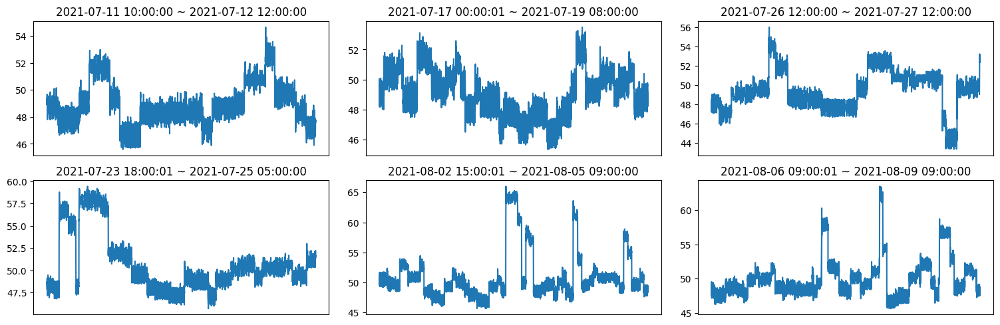


C77


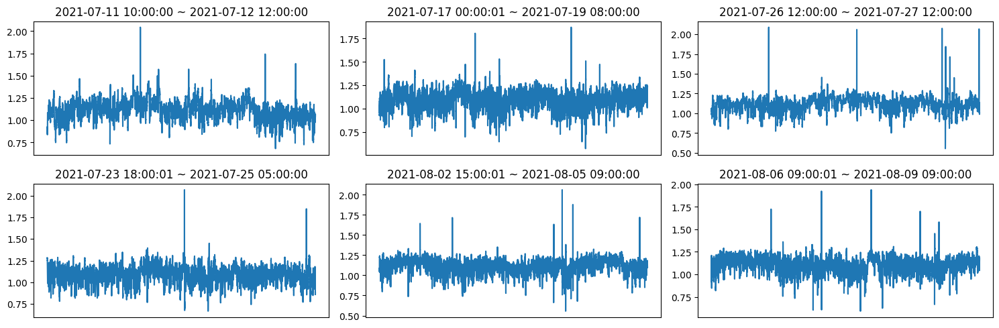


C78


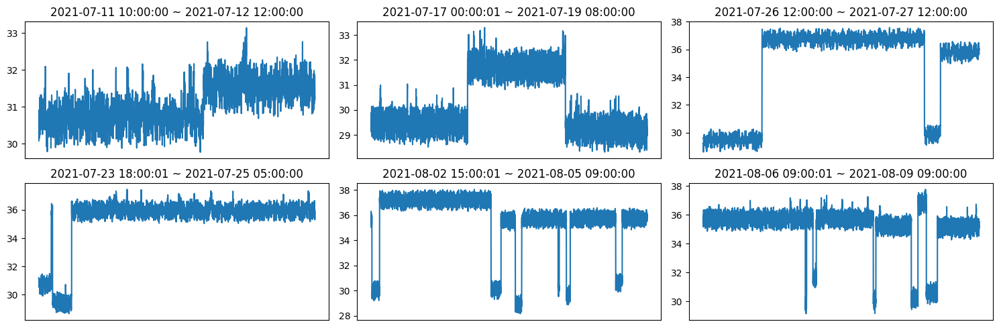


C79


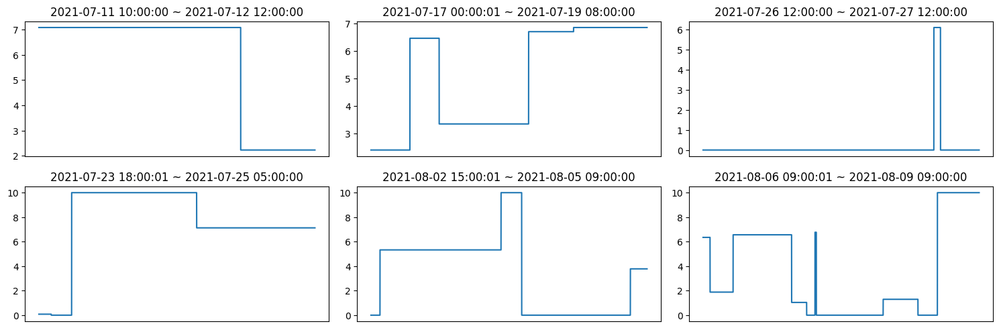


C80


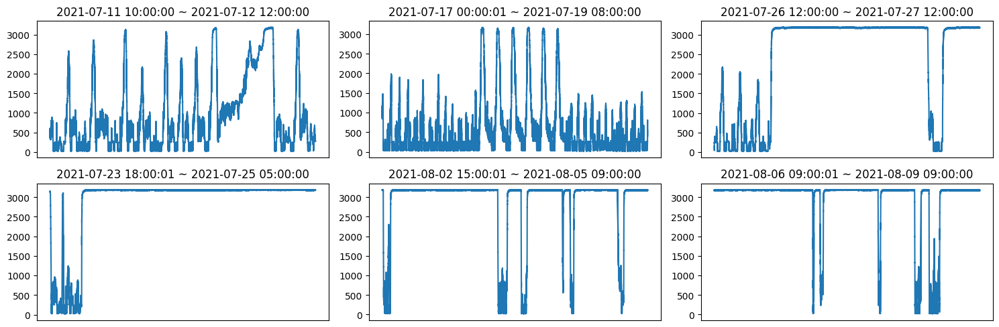


C81


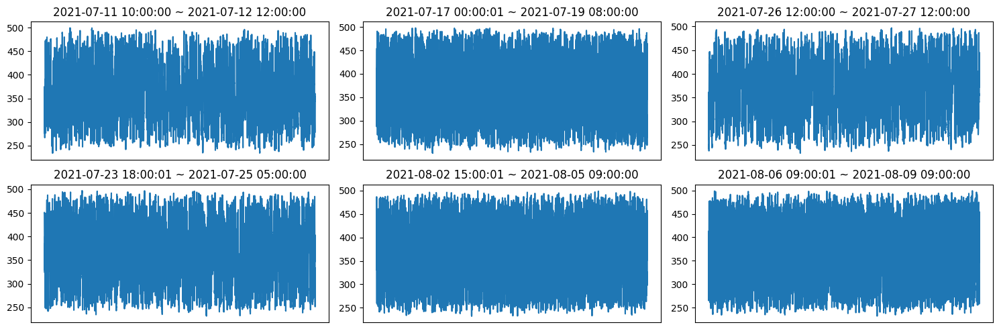


C83


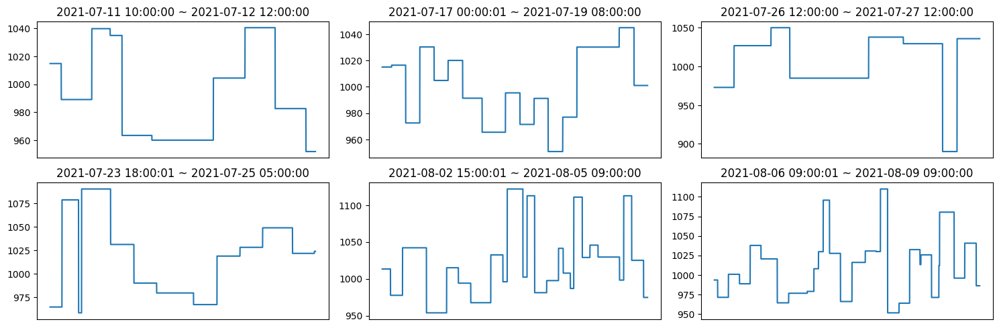


C84


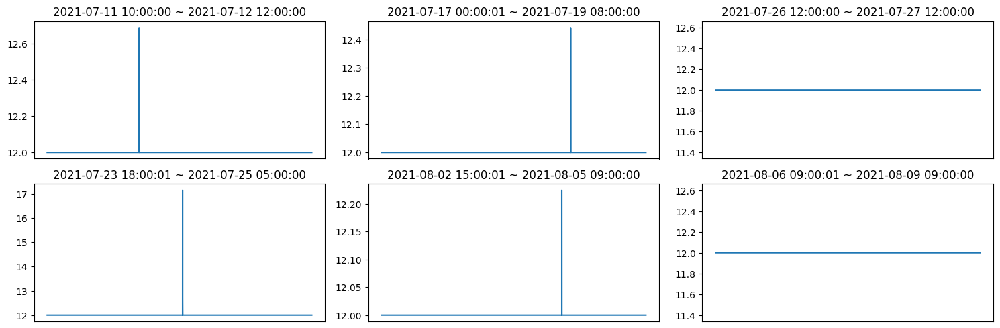


C86


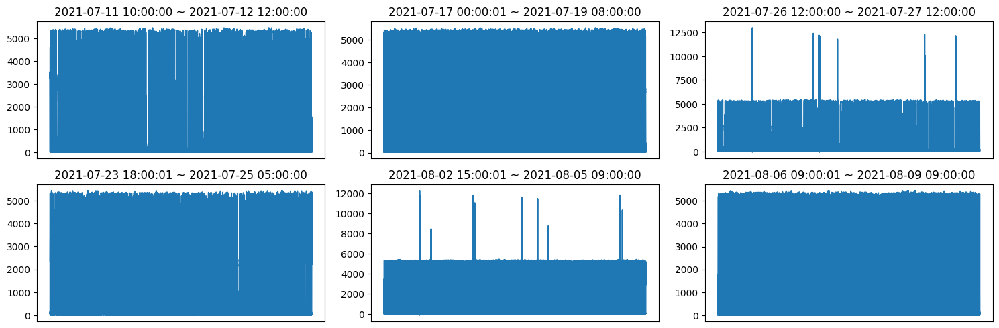

In [ ]:
columns = df.drop(['timestamp'], axis=1).columns
for column in columns:
    print(column)
    train_data_feature_plotting([column])
    print()

In [ ]:
df2 = df.drop(['timestamp'], axis=1) # 스케일링을 위해 'timestamp' column 제거 

,C01,C03,C04,C05,C06,C07,C08,C11,C12,C13,...,C75,C76,C77,C78,C79,C80,C81,C83,C84,C86
0,-2.2642,12.26196,-0.00087,12.01019,0.2254,12.66931,70,11704,17.61017,28.03686,...,26.13983,48.90190,0.92255,30.08042,7.08818,595.06104,276.40338,1014.79321,12.0,3506
1,-2.4923,12.26196,0.00058,12.56714,-0.0711,12.66931,70,11847,17.61780,28.03169,...,26.13983,48.94870,0.92255,30.08423,7.08818,531.50317,276.18634,1014.79321,12.0,3493
2,-2.8460,12.26196,-0.00072,14.48975,0.0051,12.66931,70,11953,17.61780,28.03504,...,26.14746,48.89090,0.91873,30.09148,7.08818,451.06253,279.85754,1014.79321,12.0,3490
3,-2.1235,12.26196,0.00101,15.93170,0.1842,12.66931,70,12051,17.61780,28.03510,...,26.13983,48.95938,0.91644,30.10407,7.08818,404.38739,281.50317,1014.79321,12.0,3525
4,-2.9074,12.26196,0.00043,16.10718,0.1842,12.66931,70,12180,17.61780,28.03510,...,26.13983,49.02211,0.91797,30.10331,7.08818,382.53925,281.34039,1014.79321,12.0,3503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259195,-2.0065,12.26196,0.00051,100.28228,0.5977,12.53358,70,8536,13.45978,28.03433,...,38.49182,48.07038,1.17355,35.05434,10.00000,3178.48877,370.02679,986.05908,12.0,136
259196,-2.2101,12.26196,-0.00029,100.28228,0.5509,12.53358,70,8519,13.45978,28.03521,...,38.49182,48.04736,1.16898,35.03488,10.00000,3175.36084,370.40656,986.05908,12.0,89
259197,-2.3325,12.26196,0.00152,100.28228,0.5425,12.53358,70,8508,13.45978,28.03348,...,38.49182,48.00608,1.16974,35.02840,10.00000,3175.73608,368.12787,986.05908,12.0,90
259198,-2.3049,12.26196,0.00058,100.26703,0.6266,12.53358,70,8511,13.45978,28.03605,...,38.49182,47.90826,1.16974,35.02420,10.00000,3176.61182,368.01941,986.05908,12.0,74


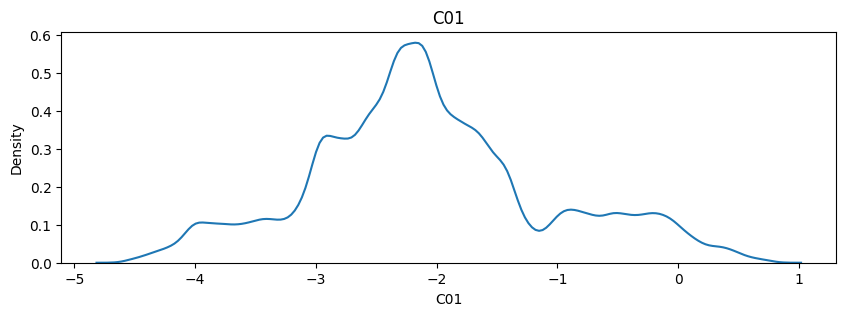

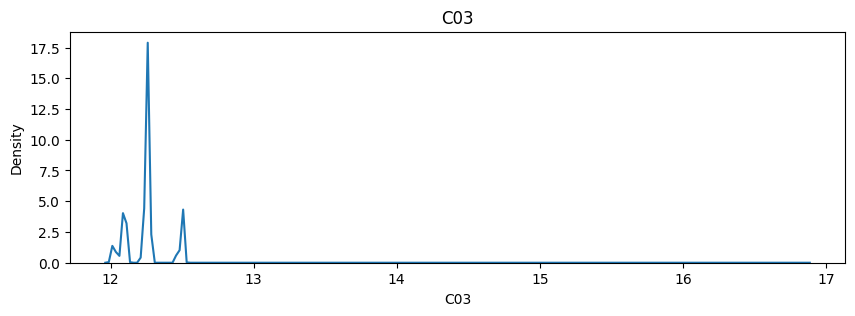

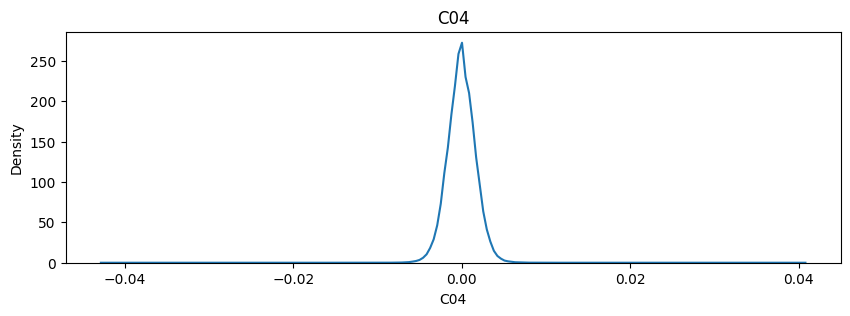

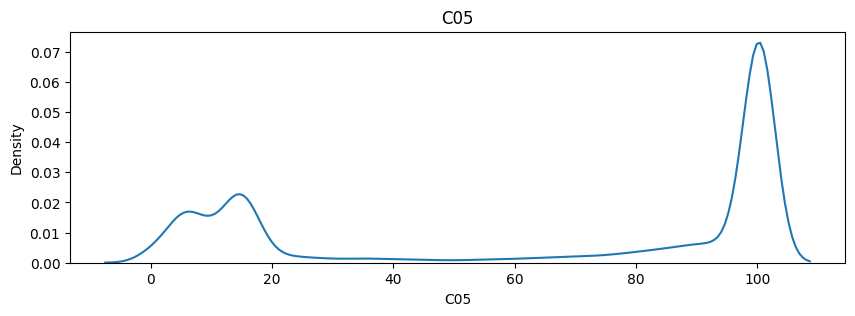

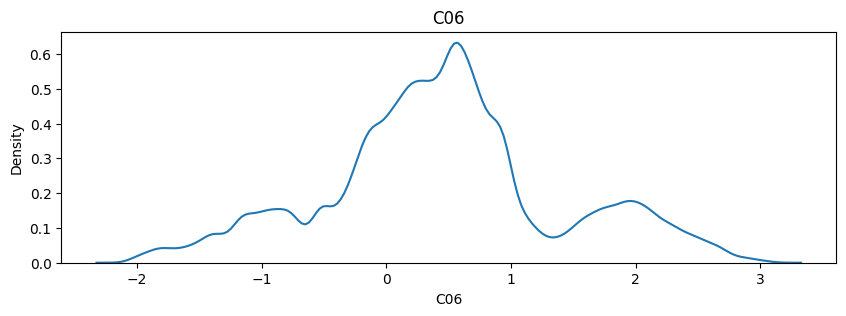

...

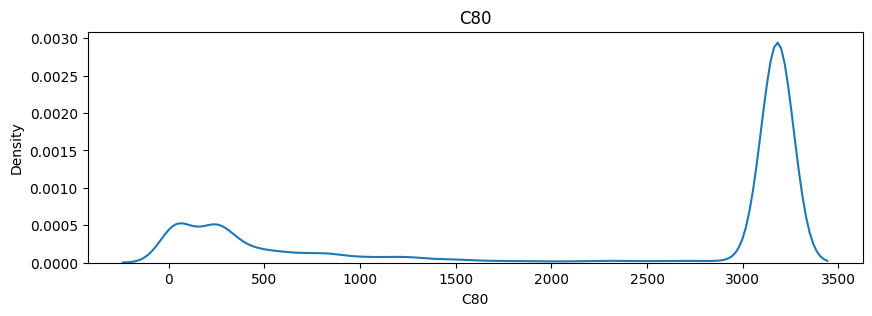

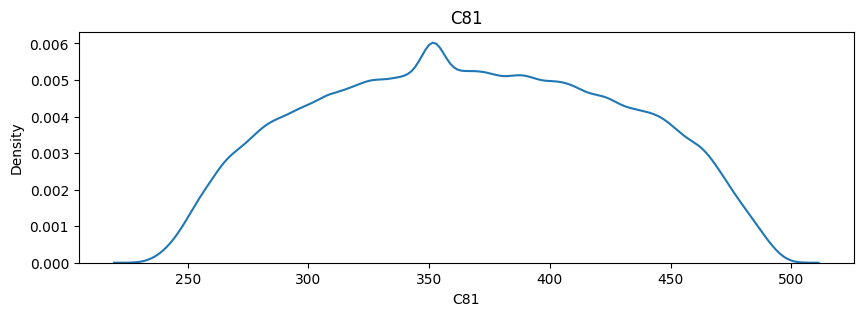

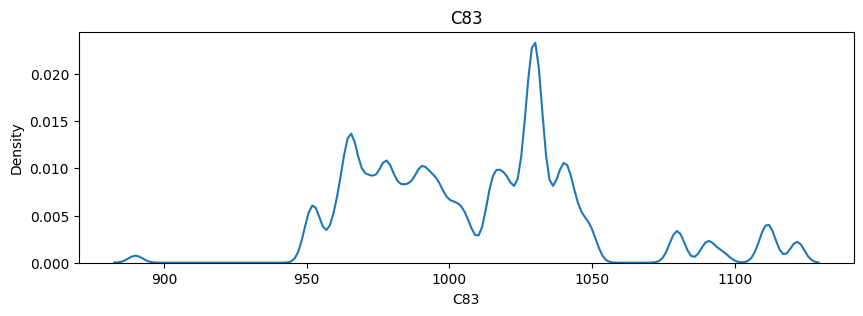

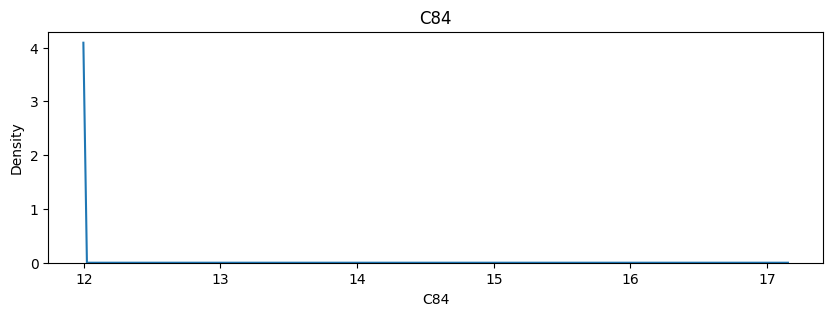

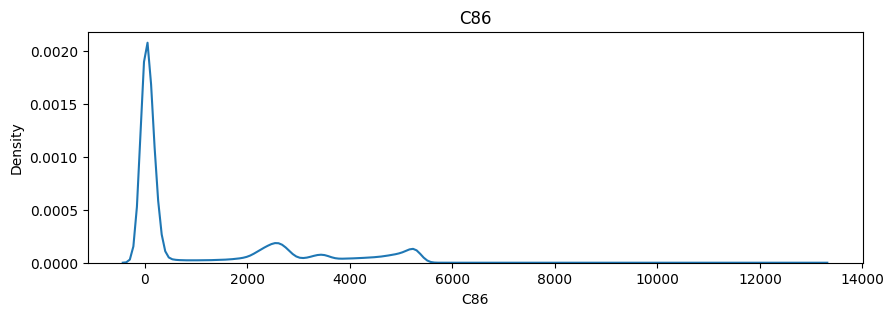

In [ ]:
for column in df2.columns:
  plt.figure(figsize=(10,3))
  # plt.hist(df2[column], bins=10, density=True)
  sns.kdeplot(df2[column])
  plt.title(column)
  plt.show()

In [ ]:
# RobustScaler
from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()
df_scaled= scaler.fit_transform(df2)
df_scaled = pd.DataFrame(df_scaled, columns=df2.columns)
df_scaled

,C01,C03,C04,C05,C06,C07,C08,C11,C12,C13,...,C75,C76,C77,C78,C79,C80,C81,C83,C84,C86
0,-0.093567,0.0,-0.380952,-0.959226,-0.208524,0.000000,0.0,-0.498615,0.604120,0.281046,...,-1.393942,-0.218706,-1.687115,-1.041360,0.256496,-0.981154,-0.918990,0.131028,0.0,1.435205
1,-0.295676,0.0,0.309524,-0.952712,-0.510121,0.000000,0.0,-0.477766,0.606408,-0.563725,...,-1.393942,-0.199322,-1.687115,-1.040626,0.256496,-1.005307,-0.921235,0.131028,0.0,1.429717
2,-0.609073,0.0,-0.309524,-0.930228,-0.432611,0.000000,0.0,-0.462312,0.606408,-0.016340,...,-1.392624,-0.223262,-1.721177,-1.039230,0.256496,-1.035877,-0.883255,0.131028,0.0,1.428451
3,0.031100,0.0,0.514286,-0.913366,-0.250432,0.000000,0.0,-0.448024,0.606408,-0.006536,...,-1.393942,-0.194898,-1.741596,-1.036805,0.256496,-1.053615,-0.866231,0.131028,0.0,1.443225
4,-0.663477,0.0,0.238095,-0.911313,-0.250432,0.000000,0.0,-0.429217,0.606408,-0.006536,...,-1.393942,-0.168915,-1.727954,-1.036952,0.256496,-1.061917,-0.867915,0.131028,0.0,1.433938
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1004397,0.134769,0.0,0.276190,0.073073,0.170176,-0.608028,0.0,-0.960490,-0.640733,-0.132353,...,0.739132,-0.563122,0.550959,-0.083397,0.680797,0.000618,0.049579,-0.410257,0.0,0.012664
1004398,-0.045632,0.0,-0.104762,0.073073,0.122571,-0.608028,0.0,-0.962968,-0.640733,0.011438,...,0.739132,-0.572657,0.510210,-0.087145,0.680797,-0.000571,0.053508,-0.410257,0.0,-0.007176
1004399,-0.154085,0.0,0.757143,0.073073,0.114027,-0.608028,0.0,-0.964572,-0.640733,-0.271242,...,0.739132,-0.589755,0.516986,-0.088393,0.680797,-0.000428,0.029934,-0.410257,0.0,-0.006754
1004400,-0.129630,0.0,0.309524,0.072894,0.199573,-0.608028,0.0,-0.964135,-0.640733,0.148693,...,0.739132,-0.630272,0.516986,-0.089201,0.680797,-0.000095,0.028812,-0.410257,0.0,-0.013508


<Axes: >

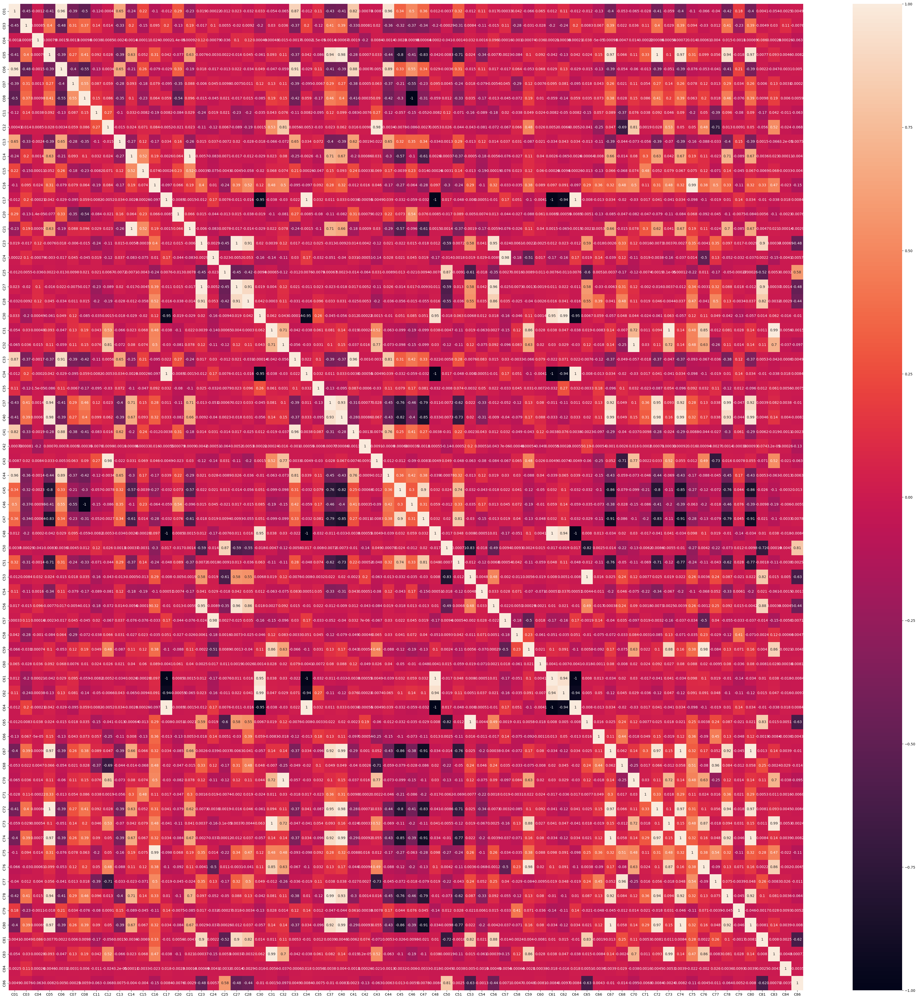

In [ ]:
# 상관계수 시각화 
plt.figure(figsize=(50,50))
sns.heatmap(df_scaled.corr(), annot = True, vmin = -1, vmax=1)

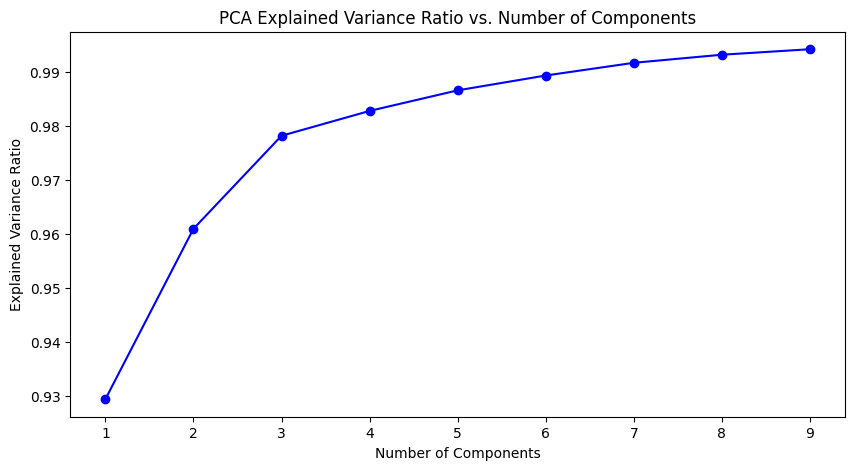

In [ ]:
# 설명력 
from sklearn.decomposition import PCA

n_components = np.arange(1, 10)
explained_variances = []

for n in n_components:
    pca = PCA(n_components=n)
    pca.fit(df_scaled)
    explained_variances.append(sum(pca.explained_variance_ratio_))

plt.figure(figsize=(10,5))
plt.plot(n_components, explained_variances, 'bo-')
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance Ratio')
plt.title('PCA Explained Variance Ratio vs. Number of Components')
plt.show()

In [ ]:
pca = PCA(n_components=3)
pca.fit(df_scaled)
df_pca = pca.transform(df_scaled)
df_pca = pd.DataFrame(data = df_pca, columns = ['PC1', 'PC2', 'PC3'])
df_pca

,PC1,PC2,PC3
0,5.769559,3.941922,0.222053
1,-1.514993,4.268095,-0.361995
2,-2.652904,4.330050,-0.387295
3,-1.080460,4.270936,-0.363707
4,3.342536,4.081734,0.239608
...,...,...,...
1004397,-14.376444,-2.306178,0.471819
1004398,-14.520160,-2.295738,0.457289
1004399,-14.378721,-2.306595,0.488837
1004400,-14.233805,-2.310702,-0.109756


In [ ]:
loadings = pd.DataFrame(pca.components_.T, columns=['PC1', 'PC2', 'PC3'], index=df_scaled.columns)
loadings_pc1 = loadings['PC1']
loadings_pc2 = loadings['PC2']
loadings_pc3 = loadings['PC3']

# Get the features with the highest absolute loading 
features_pc1 = loadings_pc1.abs().sort_values(ascending=False).index.tolist()
features_pc2 = loadings_pc2.abs().sort_values(ascending=False).index.tolist()
features_pc3 = loadings_pc3.abs().sort_values(ascending=False).index.tolist()

print("Features included in PC1:")
print(features_pc1)
print("Features included in PC2:")
print(features_pc2)
print("Features included in PC3:")
print(features_pc3)

Features included in PC1:
['C54', 'C71', 'C14', 'C37', 'C78', 'C21', 'C72', 'C05', 'C47', 'C40', 'C15', 'C51', 'C44', 'C06', 'C67', 'C80', 'C74', 'C01', 'C03', 'C13', 'C59', 'C46', 'C08', 'C75', 'C16', 'C76', 'C07', 'C33', 'C62', 'C32', 'C70', 'C12', 'C43', 'C11', 'C73', 'C60', 'C31', 'C58', 'C83', 'C77', 'C27', 'C23', 'C41', 'C45', 'C35', 'C68', 'C28', 'C30', 'C56', 'C25', 'C24', 'C57', 'C81', 'C50', 'C20', 'C66', 'C79', 'C42', 'C53', 'C65', 'C04', 'C86', 'C64', 'C61', 'C17', 'C48', 'C34', 'C84']
Features included in PC2:
['C71', 'C54', 'C15', 'C14', 'C21', 'C47', 'C45', 'C78', 'C37', 'C67', 'C51', 'C74', 'C80', 'C72', 'C05', 'C40', 'C75', 'C16', 'C03', 'C62', 'C30', 'C20', 'C07', 'C66', 'C13', 'C46', 'C08', 'C44', 'C77', 'C28', 'C68', 'C25', 'C76', 'C32', 'C70', 'C24', 'C57', 'C59', 'C12', 'C43', 'C11', 'C23', 'C01', 'C79', 'C35', 'C41', 'C56', 'C27', 'C33', 'C58', 'C81', 'C50', 'C60', 'C86', 'C48', 'C34', 'C64', 'C17', 'C61', 'C73', 'C42', 'C53', 'C65', 'C06', 'C31', 'C83', 'C04', '